In [ ]:
import numpy as np
import pandas as pd
import os
import random

from PIL import Image
from datetime import datetime
from matplotlib import pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Input, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import EfficientNetB0, DenseNet121, MobileNetV2, EfficientNetV2S
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay


SEED_VALUE = 100
np.random.seed(SEED_VALUE)
random.seed(SEED_VALUE)
tf.random.set_seed(SEED_VALUE)

# Load Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data_path = "/content/drive/My Drive/Colab Notebooks/fruit_image_dataset_CNN"

# EDA

## Image Color Histogram

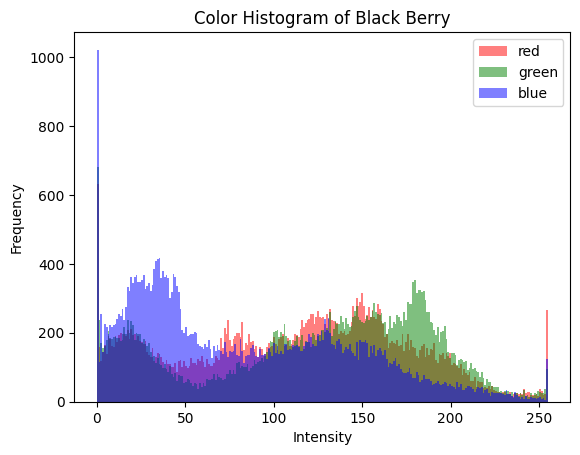

In [ ]:
def color_histogram(image_path, fruit_name):
    image = Image.open(image_path)
    image_array = np.array(image)
    colors = ['red', 'green', 'blue']
    for i, color in enumerate(colors):
        plt.hist(image_array[:,:,i].flatten(), bins=256, color=color, alpha=0.5)
        plt.xlabel('Intensity')
        plt.ylabel('Frequency')
        plt.title(f'Color Histogram of {fruit_name}')
        plt.legend(colors)
    plt.show()

image_path = os.path.join(data_path, 'black_berry', os.listdir(os.path.join(data_path, 'black_berry'))[0])
fruit_name = 'Black Berry'
color_histogram(image_path, fruit_name)



From the color histogram sample taken from an image of a blackberry, it can be observed that the color blue with low intensity has a very high frequency in this image.

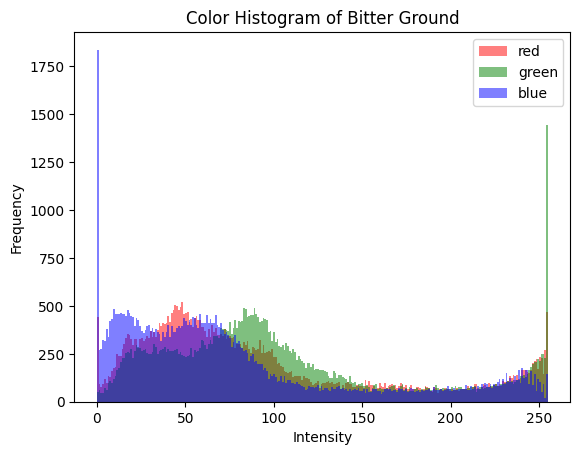

In [ ]:
image_path = os.path.join(data_path, 'bitter_gourd', os.listdir(os.path.join(data_path, 'bitter_gourd'))[0])
fruit_name = 'Bitter Ground'
color_histogram(image_path, fruit_name)


From the color histogram sample taken from an image of bitter gourd, it can be observed that the color blue with low intensity has a very high frequency in this image. Additionally, the color green with high intensity also shows a significant frequency in this bitter gourd image sample.

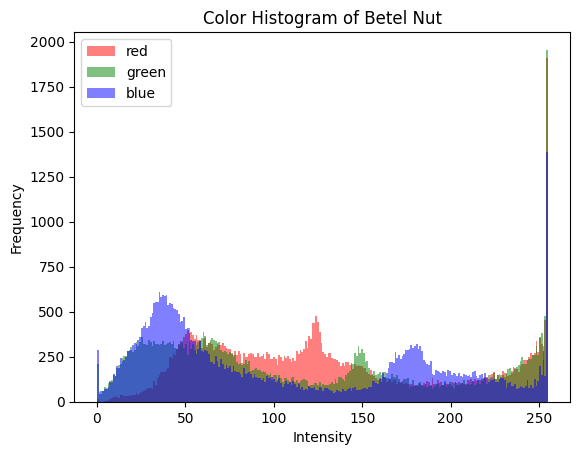

In [ ]:
image_path = os.path.join(data_path, 'betel_nut', os.listdir(os.path.join(data_path, 'betel_nut'))[0])
fruit_name = 'Betel Nut'
color_histogram(image_path, fruit_name)

From the color histogram sample taken from an image of betel nut, it can be observed that the colors blue and green with high intensity have a very high frequency in this image sample.

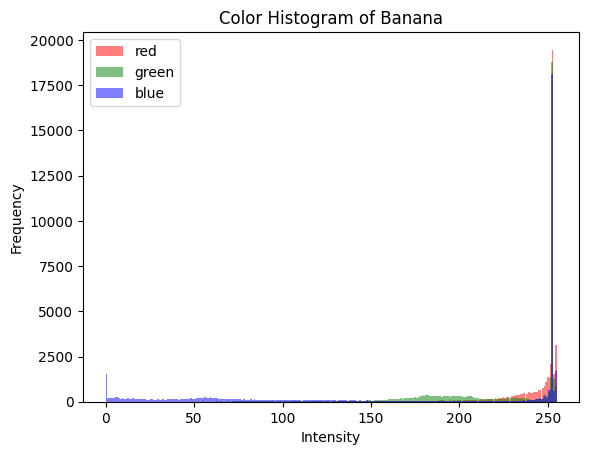

In [ ]:
image_path = os.path.join(data_path, 'banana', os.listdir(os.path.join(data_path, 'banana'))[0])
fruit_name = 'Banana'
color_histogram(image_path, fruit_name)

From the color histogram sample taken from an image of a banana, it can be observed that all RGB colors with high intensity have a very high frequency in this image sample.

## Displaying sample images from each class.

tf.Tensor([0. 1. 0. 0.], shape=(4,), dtype=float32)
tf.Tensor([0. 0. 0. 1.], shape=(4,), dtype=float32)
tf.Tensor([1. 0. 0. 0.], shape=(4,), dtype=float32)
tf.Tensor([0. 0. 1. 0.], shape=(4,), dtype=float32)


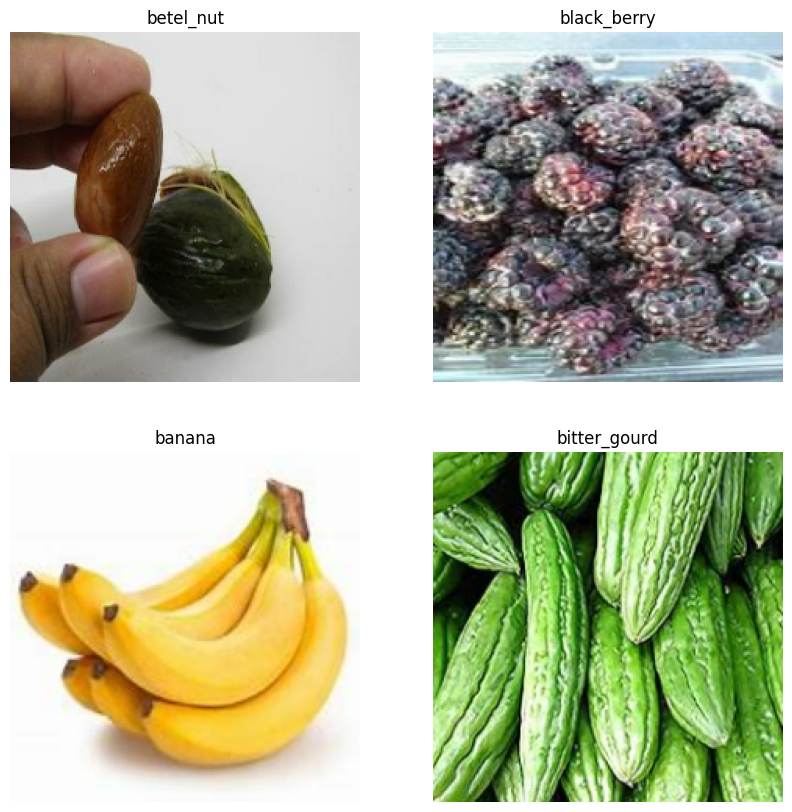

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(len(images)):
        ax = plt.subplot(2, 2, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        print(labels[i])
        plt.title(train_ds.class_names[int(np.argmax(labels[i].numpy()).astype("uint8"))])
        plt.axis("off")


From here, we can observe the characteristics of each class:

1. Betel nut has a brown color and is approximately 2.5 cm in size.
2. Black berry is characterized by its dark purple-black color and textured surface.
3. Banana is typically elongated, curved, and yellow in color.
4. Bitter gourd has a green color, an elongated shape, and a textured, ridged skin.

# Resize all images to a resolution of 224 x 224 pixels

In [ ]:
image_size = (224, 224)
batch_size = 4

# Data Splitting

Data is split into an 80% training set, a 10% validation set, and a 10% test set.

In [ ]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    os.path.join(data_path),
    validation_split=0.2,
    label_mode="categorical",
    subset="training",
    seed=SEED_VALUE,
    image_size=image_size,
    batch_size=batch_size,
)

val_test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    os.path.join(data_path),
    validation_split=0.2,
    label_mode="categorical",
    subset="validation",
    seed=SEED_VALUE,
    image_size=image_size,
    batch_size=batch_size,
)

val_size = int(0.5 * len(val_test_ds))
test_size = int(0.5 * len(val_test_ds))
val_ds = val_test_ds.take(val_size)
test_ds = val_test_ds.skip(val_size)

Found 1600 files belonging to 4 classes.
Using 1280 files for training.
Found 1600 files belonging to 4 classes.
Using 320 files for validation.


In [ ]:
train_ds.class_names

['banana', 'betel_nut', 'bitter_gourd', 'black_berry']

# Problem Identification

From the image data used, I encountered several challenges related to image quality and image variability. Here is a detailed explanation:


*   Image Quality: Some images have very low resolution, which will make it difficult for the model to recognize and predict objects in those images.
Here are examples of such images::
    * Example 1 : 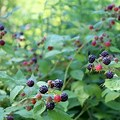

    * Example 2 : 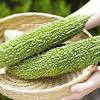

    * Example 3 : 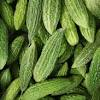

*   Background Variability : Di temukan background yang sangat mirip dengan objek utama dalam gambar. Hal ini tentunya membuat objek yang dikelilingi oleh background yang serupa membuat objek tersebut sulit untuk dikenali. Berikut contohnya yaitu terdapat gambar bitter gourd yang backgroundnya sangat serupa dengan objek.

  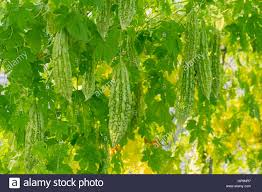





*   Occlusion: The object of interest is obstructed by other objects, making it unclear for the model. Here is an example where the blackberries are covered by plant leaves, making the fruit less visible. Additionally, in the second image labeled as bitter gourd, the bitter gourd is obscured by another object, making it difficult to see the bitter gourd itself.

    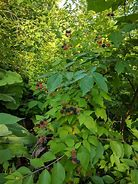

    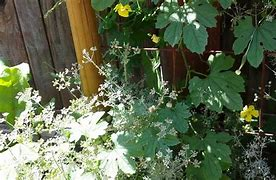  


    

    

      





# 1. Baseline Model

The pretrained VGG-16 model used here consists of 13 convolutional layers, 5 pooling layers, and 2 fully connected layers, all utilizing the ReLU activation function. The output layer employs the softmax activation function, producing 4 nodes as output.

The convolutional layers are used to extract features from images, while the pooling layers are employed to reduce the dimensionality of the features. The fully connected layers are then used to classify the images into different classes.


* In block 1, there are 2 convolutional layers with 64 filters and a kernel size of 3x3, followed by max pooling with a size of 2x2.
* In block 2, there are 2 convolutional layers with 128 filters and a kernel size of 3x3, followed by max pooling with a size of 2x2.
* In block 3, there are 3 convolutional layers with 256 filters and a kernel size of 3x3, followed by max pooling with a size of 2x2.
* In blocks 4 and 5, there are 3 convolutional layers with 512 filters and a kernel size of 3x3, followed by max pooling with a size of 2x2.


Next, the output from the pooling layers is flattened into a one-dimensional vector. This feature vector is then passed through two fully connected layers, each with 4096 neurons and using the ReLU activation function.


Then, in the output layer, there are 4 neurons (corresponding to the number of classes) with a softmax activation function. The softmax activation function converts the numerical values from the final layer into probabilities, ensuring that the total probability of the output is 1.


In [ ]:
inputs = Input(shape=(224, 224, 3))

conv = Conv2D(64, kernel_size=(3, 3), padding='same', activation='relu')(inputs)
conv = Conv2D(64, kernel_size=(3, 3), padding='same', activation='relu')(conv)
pool = MaxPool2D(pool_size=(2, 2), strides=(2, 2))(conv)

conv = Conv2D(128, kernel_size=(3, 3), padding='same', activation='relu')(pool)
conv = Conv2D(128, kernel_size=(3, 3), padding='same', activation='relu')(conv)
pool = MaxPool2D(pool_size=(2, 2), strides=(2, 2))(conv)

conv = Conv2D(256, kernel_size=(3, 3), padding='same', activation='relu')(pool)
conv = Conv2D(256, kernel_size=(3, 3), padding='same', activation='relu')(conv)
conv = Conv2D(256, kernel_size=(3, 3), padding='same', activation='relu')(conv)
pool = MaxPool2D(pool_size=(2, 2), strides=(2, 2))(conv)

conv = Conv2D(512, kernel_size=(3, 3), padding='same', activation='relu')(pool)
conv = Conv2D(512, kernel_size=(3, 3), padding='same', activation='relu')(conv)
conv = Conv2D(512, kernel_size=(3, 3), padding='same', activation='relu')(conv)
pool = MaxPool2D(pool_size=(2, 2), strides=(2, 2))(conv)

conv = Conv2D(512, kernel_size=(3, 3), padding='same', activation='relu')(pool)
conv = Conv2D(512, kernel_size=(3, 3), padding='same', activation='relu')(conv)
conv = Conv2D(512, kernel_size=(3, 3), padding='same', activation='relu')(conv)
pool = MaxPool2D(pool_size=(2, 2), strides=(2, 2))(conv)

X = Flatten()(pool)

# fully connected layers
X = Dense(4096, activation='relu')(X)
X = Dense(4096, activation='relu')(X)
outputs = Dense(4, activation='softmax')(X)

model_baseline = Model(inputs=inputs, outputs=outputs)
model_baseline.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 64)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 128)     147584    
                                                             

In [ ]:
model_baseline.compile(optimizer=Adam(learning_rate= 0.001), loss='categorical_crossentropy', metrics=["accuracy"])

In [ ]:
epochs = 50

timestamp1 = datetime.now()
history_base = model_baseline.fit(train_ds, epochs=epochs, validation_data=val_ds, verbose=1)
timestamp2 = datetime.now()

print("Training time : {} seconds".format((timestamp2 - timestamp1).total_seconds()))

Epoch 1/50
320/320 [==============================] - 46s 108ms/step - loss: 55.7660 - accuracy: 0.2352 - val_loss: 1.3883 - val_accuracy: 0.2500
Epoch 2/50
320/320 [==============================] - 35s 109ms/step - loss: 1.3866 - accuracy: 0.2453 - val_loss: 1.3899 - val_accuracy: 0.2000
Epoch 3/50
320/320 [==============================] - 35s 110ms/step - loss: 1.3865 - accuracy: 0.2547 - val_loss: 1.3900 - val_accuracy: 0.2125
Epoch 4/50
320/320 [==============================] - 35s 109ms/step - loss: 1.3865 - accuracy: 0.2500 - val_loss: 1.3901 - val_accuracy: 0.2125
Epoch 5/50
320/320 [==============================] - 36s 112ms/step - loss: 1.3864 - accuracy: 0.2477 - val_loss: 1.3909 - val_accuracy: 0.2125
Epoch 6/50
320/320 [==============================] - 36s 111ms/step - loss: 1.3865 - accuracy: 0.2508 - val_loss: 1.3902 - val_accuracy: 0.2062
Epoch 7/50
320/320 [==============================] - 36s 112ms/step - loss: 1.3865 - accuracy: 0.2383 - val_loss: 1.3909 - val_a

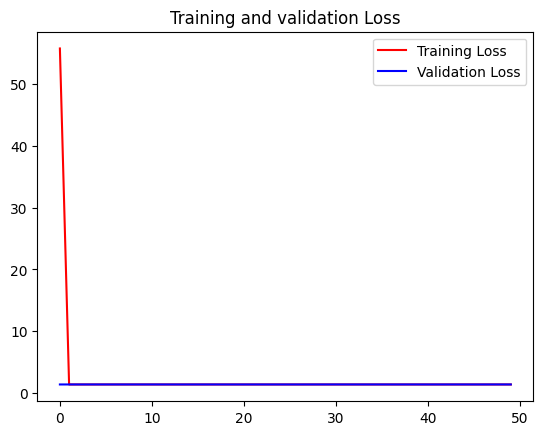

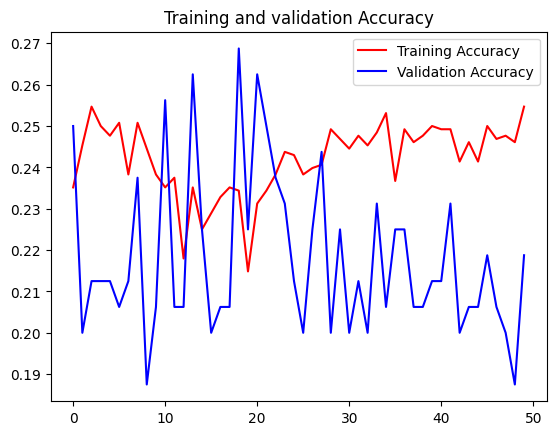

In [ ]:
acc = history_base.history[ 'accuracy']
loss = history_base.history['loss']
val_accuracy = history_base.history['val_accuracy']
val_loss = history_base.history['val_loss']
epochs = range(0,len(loss))

plt.plot(epochs, loss, 'r', label="Training Loss")
plt.plot(epochs, val_loss, 'b', label="Validation Loss")
plt.title("Training and validation Loss".format())
plt.legend()
plt.show()

plt.plot(epochs, acc, 'r', label="Training Accuracy")
plt.plot(epochs, val_accuracy, 'b', label="Validation Accuracy")
plt.title("Training and validation Accuracy".format())
plt.legend()
plt.show()

avg_train_acc = np.mean(acc)
avg_train_loss = np.mean(loss)
avg_val_acc = np.mean(val_accuracy)
avg_val_loss = np.mean(val_loss)


From the graph above, it is evident that the model's accuracy is still poor, indicating that further improvements are needed.

In [ ]:
print(f'Average of Training Accuracy: {np.mean(acc)}')
print(f'Average of Training Loss: {np.mean(loss)}')
print(f'Average of Validation Accuracy: {np.mean(val_accuracy)}')
print(f'Average of Validation Loss: {np.mean(val_loss)}')

Average of Training Accuracy: 0.2419843739271164
Average of Training Loss: 2.4739691114425657
Average of Validation Accuracy: 0.21799999982118606
Average of Validation Loss: 1.3906812214851378


### Baseline Model Evaluation

In [ ]:
def test_model(model, test_ds):
  y_true = []
  y_preds = []

  for i, labels in test_ds:
    y_pred = model.predict(i)
    y_true.extend(labels.numpy())
    y_preds.extend(y_pred)

  y_true = np.argmax(y_true, axis=1)
  y_pred_labels = np.argmax(y_preds, axis=1)

  # Confusion Matrix
  matrix = confusion_matrix(y_true=y_true, y_pred=y_pred_labels)
  disp = ConfusionMatrixDisplay(confusion_matrix=matrix)

  class_names = ['banana', 'betel_nut', 'bitter_gourd', 'black_berry']
  for i in range(len(matrix)):
      print(f"Index {i}: {class_names[i]}")

  disp.plot()
  plt.show()

  # Classification Report
  report = classification_report(y_true=y_true, y_pred=y_pred_labels)
  print("Classification Report:")
  print(report)

  return y_preds, y_true

1/1 [==============================] - 0s 20ms/step
Index 0: banana
Index 1: betel_nut
Index 2: bitter_gourd
Index 3: black_berry


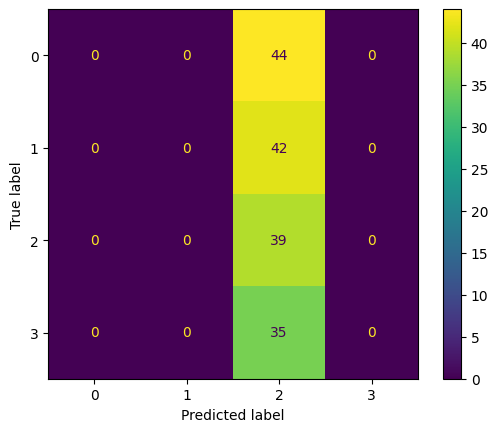

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        44
           1       0.00      0.00      0.00        42
           2       0.24      1.00      0.39        39
           3       0.00      0.00      0.00        35

    accuracy                           0.24       160
   macro avg       0.06      0.25      0.10       160
weighted avg       0.06      0.24      0.10       160



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
y_pred,y = test_model(model_baseline, test_ds)


From the test results, it is evident that the Baseline Model has a very low accuracy of only 24%. Additionally, the classification matrix shows that this model classifies all images into class 2, which is bitter gourd.

Therefore, adjustments to the Baseline Model are necessary and will be carried out as follows








In [ ]:
model_baseline.evaluate(test_ds)

40/40 [==============================] - 2s 31ms/step - loss: 1.3862 - accuracy: 0.2625


[1.3862382173538208, 0.26249998807907104]

# 2. Modified Model


Here, I modified the architecture by using EfficientNetB0. The reason for choosing EfficientNet is that after trial and error with several backbones, including VGG and EfficientNet, I found that EfficientNet is well-suited for this image data. This is evidenced by its performance in image prediction. For instance, the model with the EfficientNet backbone, before hyperparameter tuning (model_modif_1), achieved an accuracy of 96% during testing. Additionally, the model with hyperparameter tuning (model_modif_2) achieved an accuracy of 98%. This indicates that the model has successfully addressed the challenges present in the given image data.

In the architecture below, I included a Dropout layer between the fully connected layers. This is aimed at reducing inter-neuron dependency and preventing overfitting.

I also used EarlyStopping to prevent overfitting.

In [ ]:
inputs = Input(shape=(224, 224, 3))

base_model = EfficientNetB0(include_top=False, input_tensor=inputs, weights='imagenet')

base_model.trainable = False

X = layers.GlobalAveragePooling2D()(base_model.output)
X = layers.Dense(1028, activation='relu')(X)
X = Dropout(0.3)(X)
X = layers.Dense(2056, activation='relu')(X)
outputs = layers.Dense(4, activation='softmax')(X)

model_modif_1 = Model(inputs=inputs, outputs=outputs)
model_modif_1.summary()

16705208/16705208 [==============================] - 2s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_2[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 224, 224, 3)          7         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 rescaling_1 (Rescaling)   

In [ ]:
model_modif_1.compile(optimizer=Adam(learning_rate= 0.0001), loss='categorical_crossentropy', metrics=["accuracy"])

In [ ]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True)

In [ ]:
epochs = 50

timestamp1 = datetime.now()
history_modif_1 = model_modif_1.fit(train_ds, epochs=epochs, validation_data=val_ds, callbacks=[early_stopping], verbose=1)
timestamp2 = datetime.now()

print("Training time : {} seconds".format((timestamp2 - timestamp1).total_seconds()))

Epoch 1/50
320/320 [==============================] - 21s 33ms/step - loss: 0.2110 - accuracy: 0.9453 - val_loss: 0.0184 - val_accuracy: 1.0000
Epoch 2/50
320/320 [==============================] - 9s 27ms/step - loss: 0.0173 - accuracy: 0.9961 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 3/50
320/320 [==============================] - 9s 27ms/step - loss: 0.0072 - accuracy: 0.9984 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 4/50
320/320 [==============================] - 7s 23ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 0.0067 - val_accuracy: 1.0000
Epoch 5/50
320/320 [==============================] - 8s 26ms/step - loss: 0.0023 - accuracy: 0.9992 - val_loss: 0.0116 - val_accuracy: 1.0000
Epoch 6/50
320/320 [==============================] - 8s 25ms/step - loss: 0.0060 - accuracy: 0.9984 - val_loss: 0.0058 - val_accuracy: 1.0000
Epoch 7/50
320/320 [==============================] - 7s 23ms/step - loss: 7.2632e-04 - accuracy: 1.0000 - val_loss: 0.0053 - val_accuracy: 1

The model stopped at epoch 30 out of a total of 50 epochs. This occurred due to EarlyStopping, where there was no improvement in val_loss for 10 consecutive epochs.

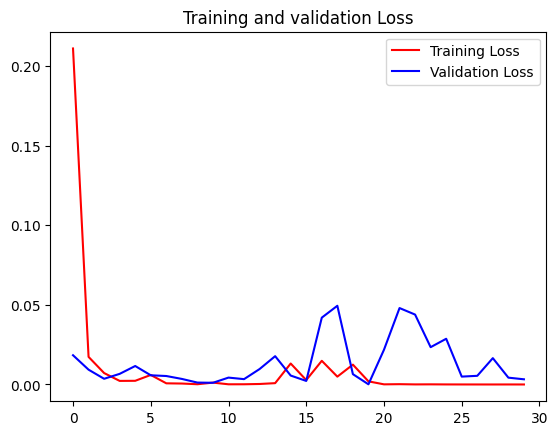

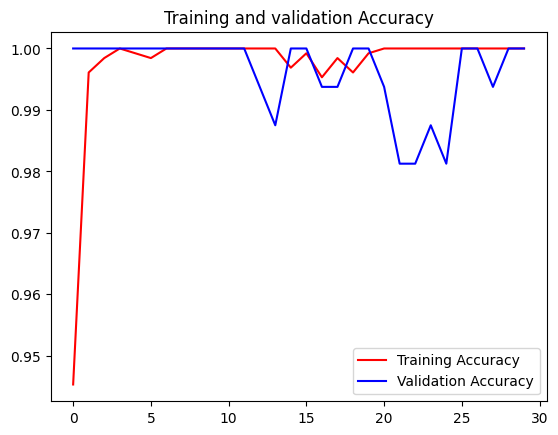

In [ ]:
acc = history_modif_1.history[ 'accuracy']
loss = history_modif_1.history['loss']
val_accuracy = history_modif_1.history['val_accuracy']
val_loss = history_modif_1.history['val_loss']
epochs = range(0,len(loss))

plt.plot(epochs, loss, 'r', label="Training Loss")
plt.plot(epochs, val_loss, 'b', label="Validation Loss")
plt.title("Training and validation Loss".format())
plt.legend()
plt.show()

plt.plot(epochs, acc, 'r', label="Training Accuracy")
plt.plot(epochs, val_accuracy, 'b', label="Validation Accuracy")
plt.title("Training and validation Accuracy".format())
plt.legend()
plt.show()

avg_train_acc = np.mean(acc)
avg_train_loss = np.mean(loss)
avg_val_acc = np.mean(val_accuracy)
avg_val_loss = np.mean(val_loss)


From the graph above, it can be seen that there is no overfitting, and it can be said that the model is well-fitted. However, to achieve even better results, hyperparameter tuning will be conducted to find the hyperparameters that can enhance the model's performance.

In [ ]:
print(f'Average of Training Accuracy: {np.mean(acc)}')
print(f'Average of Training Loss: {np.mean(loss)}')
print(f'Average of Validation Accuracy: {np.mean(val_accuracy)}')
print(f'Average of Validation Loss: {np.mean(val_loss)}')

Average of Training Accuracy: 0.9974218785762787
Average of Training Loss: 0.01002596761195491
Average of Validation Accuracy: 0.9962499956289927
Average of Validation Loss: 0.013590851120291821


In [ ]:
model_modif_1.evaluate(test_ds)

40/40 [==============================] - 1s 20ms/step - loss: 0.2083 - accuracy: 0.9688


[0.20834510028362274, 0.96875]

1/1 [==============================] - 0s 25ms/step
Index 0: banana
Index 1: betel_nut
Index 2: bitter_gourd
Index 3: black_berry


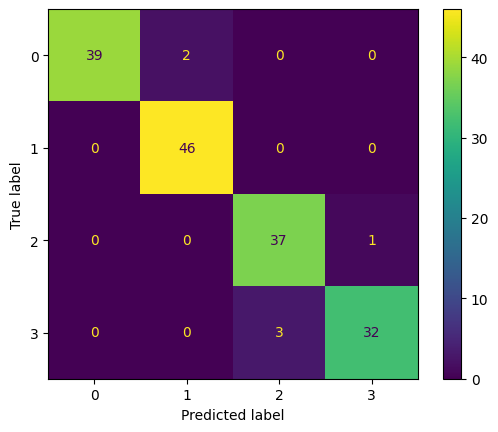

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.95      0.97        41
           1       0.96      1.00      0.98        46
           2       0.93      0.97      0.95        38
           3       0.97      0.91      0.94        35

    accuracy                           0.96       160
   macro avg       0.96      0.96      0.96       160
weighted avg       0.96      0.96      0.96       160



In [ ]:
y_pred,y = test_model(model_modif_1, test_ds)


From the test results, it is evident that the model's accuracy is very good compared to the baseline model in section 2c. The model achieved an accuracy of 96%, correctly predicting all instances of class 1 (betel nut). There was 1 error in predicting class 0, 1 error in predicting class 2, and 3 errors in predicting class 3.

# Hyperparameter Tuning

In [ ]:
def create_model(hyperparam):
  hp_units = hyperparam.Int('units', min_value = 1024, max_value = 4096, step = 1024)
  hp_lr = hyperparam.Choice('learning_rate', values=[0.001, 0.0001, 0.00001])

  inputs = Input(shape=(224, 224, 3))
  base_model = EfficientNetB0(include_top=False, input_tensor=inputs, weights='imagenet')
  base_model.trainable = False

  X = layers.GlobalAveragePooling2D()(base_model.output)
  X = layers.Dense(units = hp_units, activation='relu')(X)
  X = Dropout(0.3)(X)
  X = layers.Dense(units = hp_units, activation='relu')(X)
  outputs = layers.Dense(4, activation='softmax')(X)

  model = Model(inputs=inputs, outputs=outputs)
  model.compile(optimizer=Adam(learning_rate=hp_lr), loss='categorical_crossentropy', metrics=['accuracy'])
  return model

In [ ]:
import keras_tuner as kt

tuner = kt.Hyperband(create_model, objective='val_loss', max_epochs=10, factor=3, project_name='kt', directory='exp')

In [ ]:
tuner.search(train_ds, validation_data = val_ds, epochs=50, callbacks=[early_stopping])

best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 18 Complete [00h 02m 23s]
val_loss: 0.0024014399386942387

Best val_loss So Far: 0.0021046025212854147
Total elapsed time: 00h 20m 09s


In [ ]:
best_hp.values

{'units': 1024,
 'learning_rate': 0.0001,
 'tuner/epochs': 10,
 'tuner/initial_epoch': 4,
 'tuner/bracket': 2,
 'tuner/round': 2,
 'tuner/trial_id': '0014'}


The hyperparameters that were tuned are units and learning_rate. The best hyperparameters obtained are units = 1024 and learning_rate = 0.0001. These hyperparameters will be used in the model below (model_modif_2).

# 3. Modified Model Based on Hpyerparameter Tuning

In [ ]:
inputs = Input(shape=(224, 224, 3))

base_model = EfficientNetB0(include_top=False, input_tensor=inputs, weights='imagenet')

base_model.trainable = False # Freeze the base model # set the weights untrainable for transfer learning

X = layers.GlobalAveragePooling2D()(base_model.output)
X = layers.Dense(1024, activation='relu')(X)
X = Dropout(0.3)(X)
X = layers.Dense(1024, activation='relu')(X)
outputs = layers.Dense(4, activation='softmax')(X)

model_modif_2 = Model(inputs=inputs, outputs=outputs)
model_modif_2.summary()

__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling_2 (Rescaling)     (None, 224, 224, 3)          0         ['input_2[0][0]']             
                                                                                                  
 normalization_1 (Normaliza  (None, 224, 224, 3)          7         ['rescaling_2[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_3 (Rescaling)     (None, 224, 224, 3)          0         ['normalization_1[0][0]']     
          

In [ ]:
model_modif_2.compile(optimizer=Adam(learning_rate= 0.0001), loss='categorical_crossentropy', metrics=["accuracy"])

In [ ]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True)

In [ ]:
epochs = 50

timestamp1 = datetime.now()
history_modif_2 = model_modif_2.fit(train_ds, epochs=epochs, validation_data=val_ds, callbacks=[early_stopping], verbose=1)
timestamp2 = datetime.now()

print("Training time : {} seconds".format((timestamp2 - timestamp1).total_seconds()))

Epoch 1/50
320/320 [==============================] - 18s 31ms/step - loss: 0.2303 - accuracy: 0.9469 - val_loss: 0.0374 - val_accuracy: 0.9937
Epoch 2/50
320/320 [==============================] - 8s 26ms/step - loss: 0.0241 - accuracy: 0.9930 - val_loss: 0.0100 - val_accuracy: 1.0000
Epoch 3/50
320/320 [==============================] - 7s 21ms/step - loss: 0.0079 - accuracy: 0.9984 - val_loss: 0.0215 - val_accuracy: 0.9937
Epoch 4/50
320/320 [==============================] - 8s 23ms/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 0.0160 - val_accuracy: 0.9937
Epoch 5/50
320/320 [==============================] - 9s 28ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.0043 - val_accuracy: 1.0000
Epoch 6/50
320/320 [==============================] - 12s 38ms/step - loss: 9.4688e-04 - accuracy: 1.0000 - val_loss: 0.0128 - val_accuracy: 0.9937
Epoch 7/50
320/320 [==============================] - 9s 28ms/step - loss: 6.2339e-04 - accuracy: 1.0000 - val_loss: 0.0108 - val_accura


The model stopped at epoch 33 out of a total of 50 epochs. This occurred due to EarlyStopping, as there was no improvement in val_loss for 10 consecutive epochs.

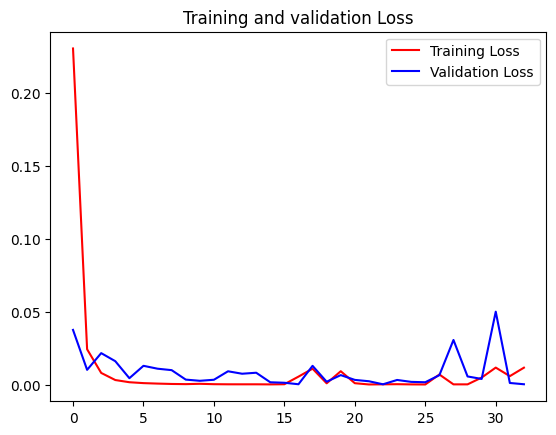

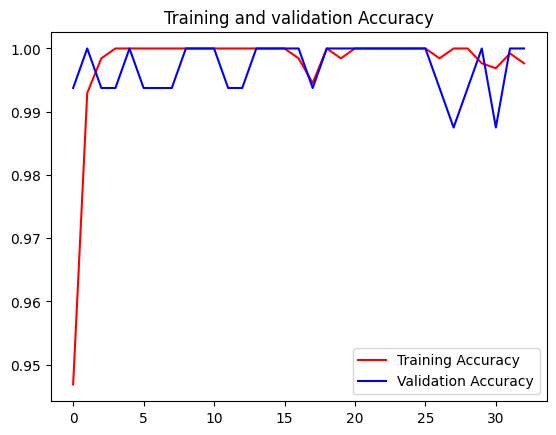

In [ ]:
acc = history_modif_2.history[ 'accuracy']
loss = history_modif_2.history['loss']
val_accuracy = history_modif_2.history['val_accuracy']
val_loss = history_modif_2.history['val_loss']
epochs = range(0,len(loss))

plt.plot(epochs, loss, 'r', label="Training Loss")
plt.plot(epochs, val_loss, 'b', label="Validation Loss")
plt.title("Training and validation Loss".format())
plt.legend()
plt.show()

plt.plot(epochs, acc, 'r', label="Training Accuracy")
plt.plot(epochs, val_accuracy, 'b', label="Validation Accuracy")
plt.title("Training and validation Accuracy".format())
plt.legend()
plt.show()

avg_train_acc = np.mean(acc)
avg_train_loss = np.mean(loss)
avg_val_acc = np.mean(val_accuracy)
avg_val_loss = np.mean(val_loss)


From the graph above, it can be seen that the model is a good fit.

In [ ]:
print(f'Average of Training Accuracy: {np.mean(acc)}')
print(f'Average of Training Loss: {np.mean(loss)}')
print(f'Average of Validation Accuracy: {np.mean(val_accuracy)}')
print(f'Average of Validation Loss: {np.mean(val_loss)}')

Average of Training Accuracy: 0.9975615541140238
Average of Training Loss: 0.010261025860789672
Average of Validation Accuracy: 0.9971590836842855
Average of Validation Loss: 0.008780689475260619


# Best Modified Model Evaluation

1/1 [==============================] - 0s 27ms/step
Index 0: banana
Index 1: betel_nut
Index 2: bitter_gourd
Index 3: black_berry


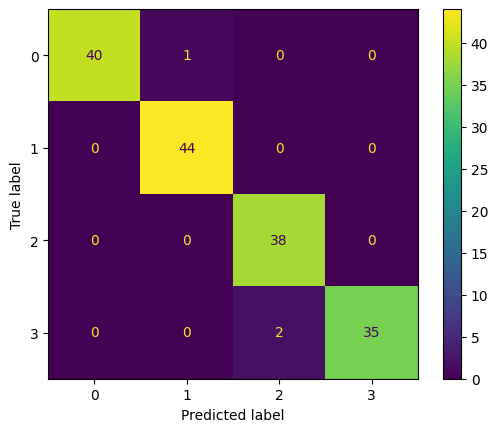

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        41
           1       0.98      1.00      0.99        44
           2       0.95      1.00      0.97        38
           3       1.00      0.95      0.97        37

    accuracy                           0.98       160
   macro avg       0.98      0.98      0.98       160
weighted avg       0.98      0.98      0.98       160



In [ ]:
y_pred,y = test_model(model_modif_2, test_ds)

* The accuracy achieved with the hyperparameter-tuned model is high at 98%. From the evaluation matrix, it is evident that the model successfully predicted all images in classes 1 (betel nut) and 2 (bitter gourd) from the test data.

* However, there was one image in class 0, which should have been labeled as banana but was incorrectly predicted as class 1 (betel nut).

* Additionally, the model incorrectly predicted 2 images in class 3, which should have been labeled as black berry but were misclassified as class 2 (bitter gourd).








In [ ]:
model_modif_2.evaluate(test_ds)

40/40 [==============================] - 2s 31ms/step - loss: 0.1634 - accuracy: 0.9812


[0.16335467994213104, 0.981249988079071]

1/1 [==============================] - 0s 27ms/step


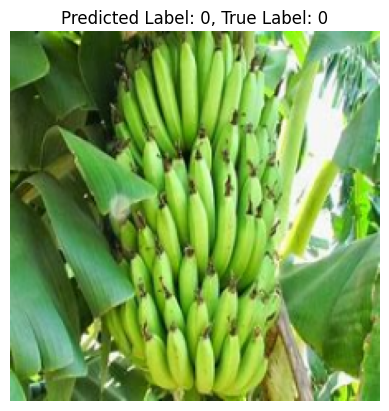

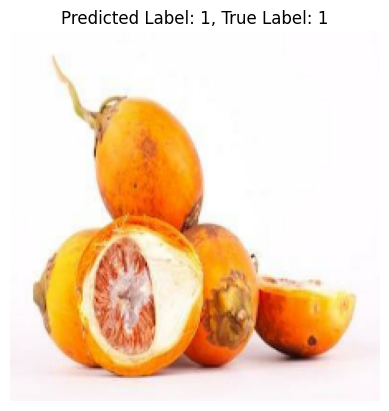

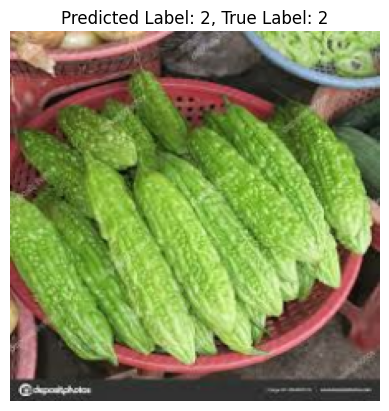

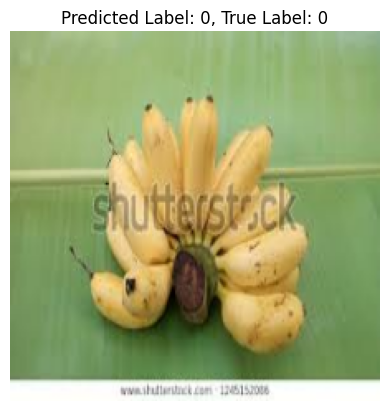

1/1 [==============================] - 0s 26ms/step


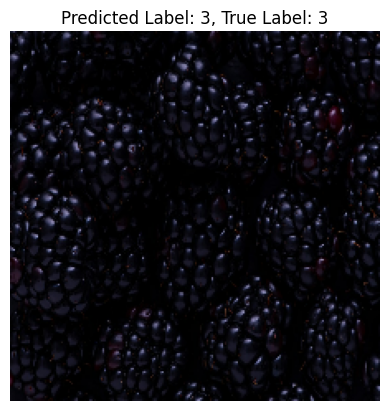

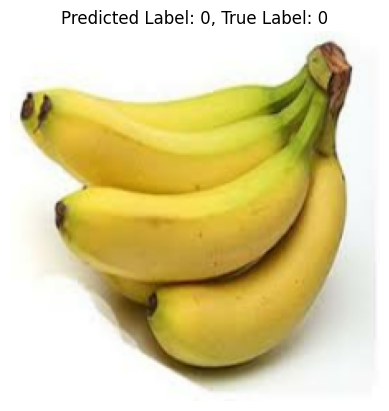

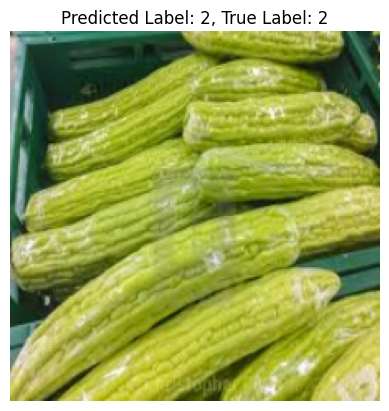

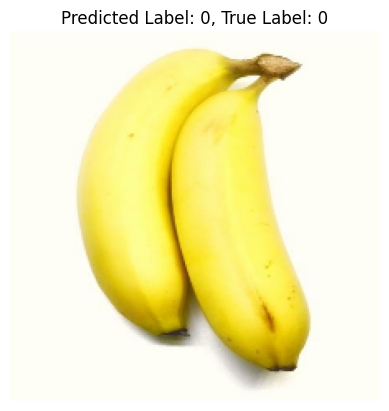

1/1 [==============================] - 0s 26ms/step


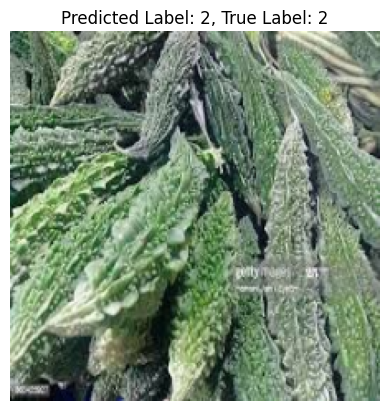

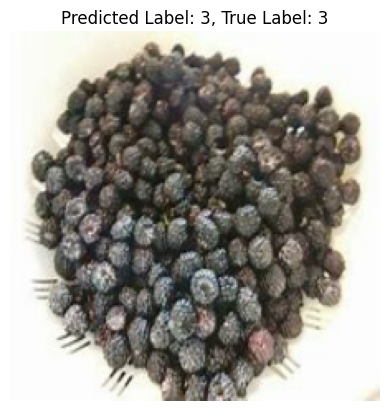

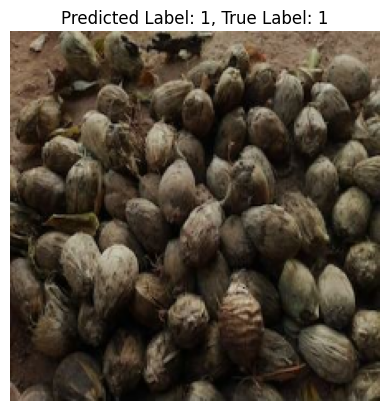

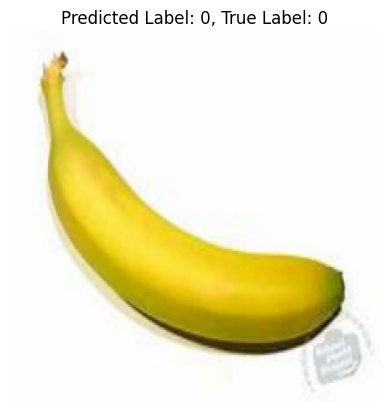

1/1 [==============================] - 0s 26ms/step


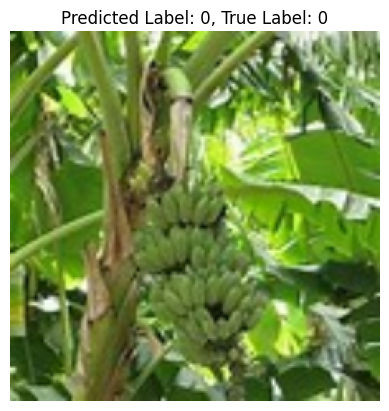

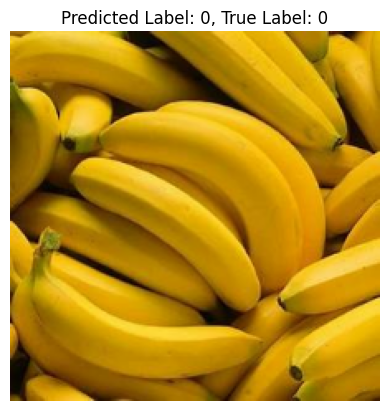

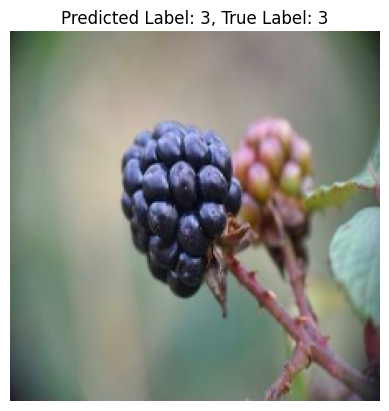

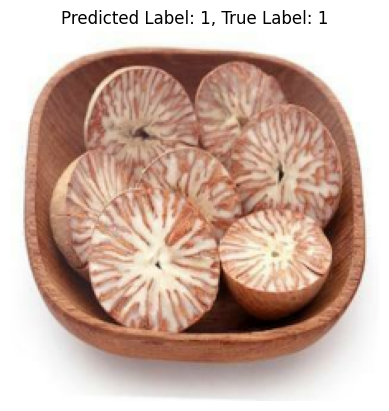

1/1 [==============================] - 0s 41ms/step


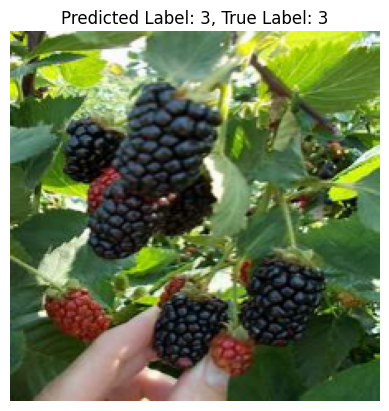

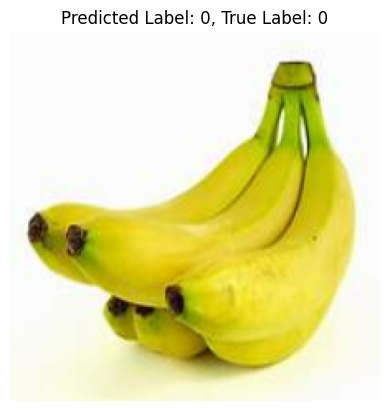

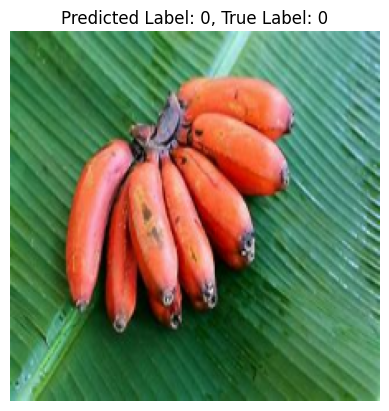

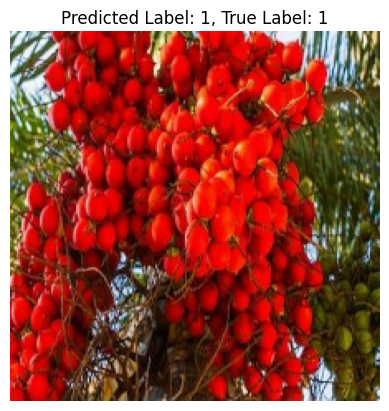

1/1 [==============================] - 0s 63ms/step


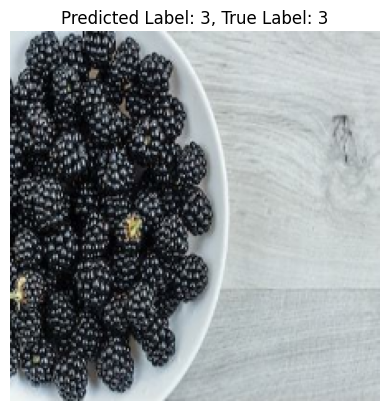

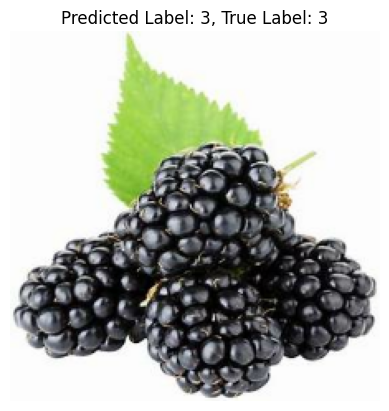

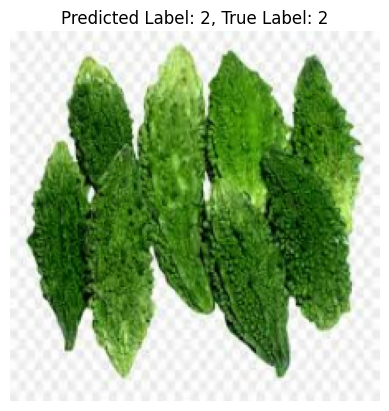

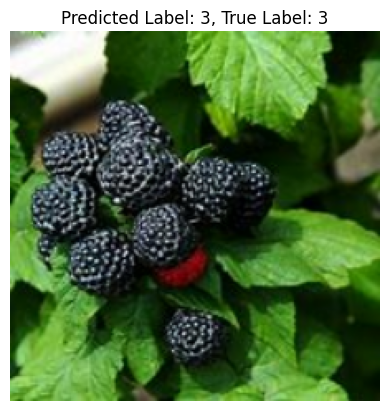

1/1 [==============================] - 0s 49ms/step


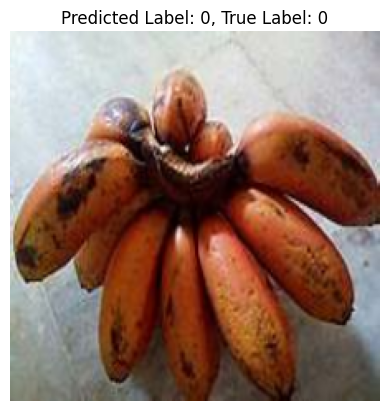

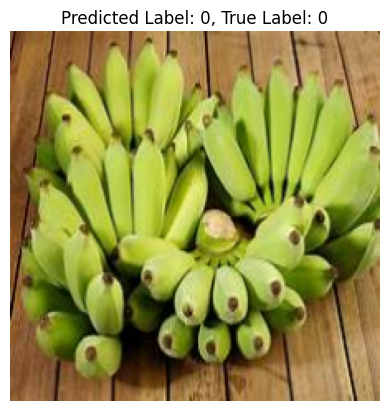

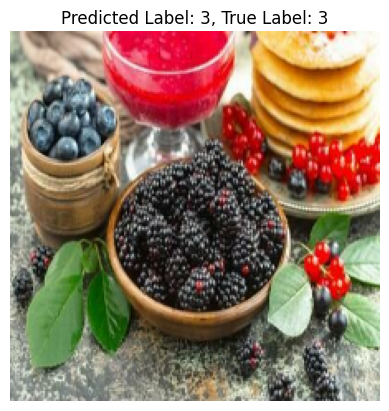

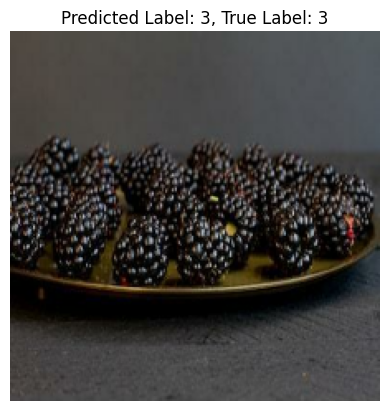

1/1 [==============================] - 0s 74ms/step


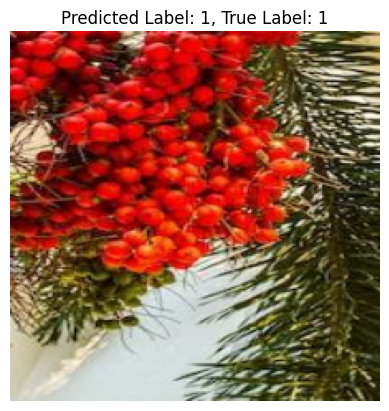

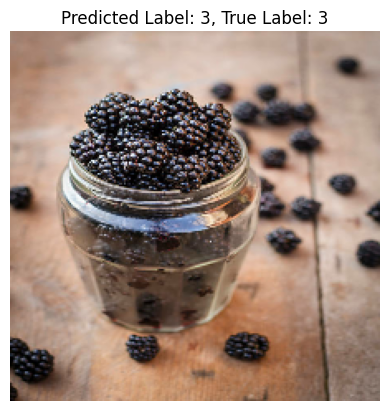

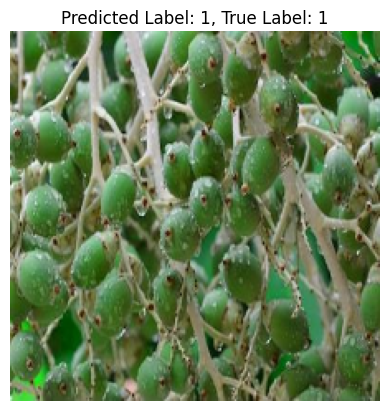

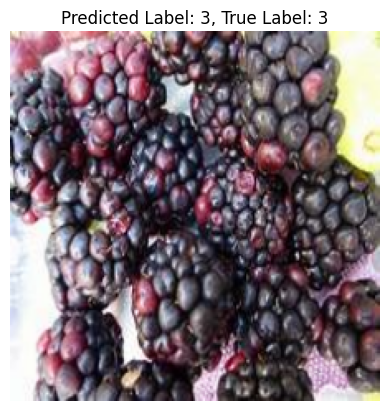

1/1 [==============================] - 0s 81ms/step


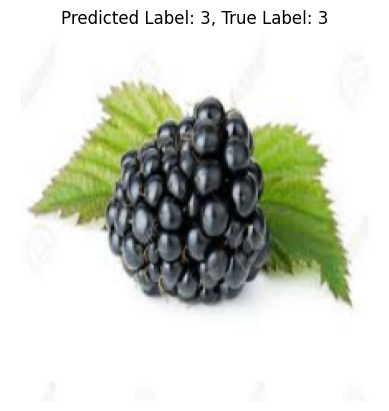

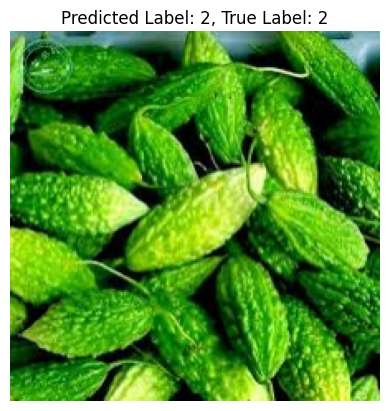

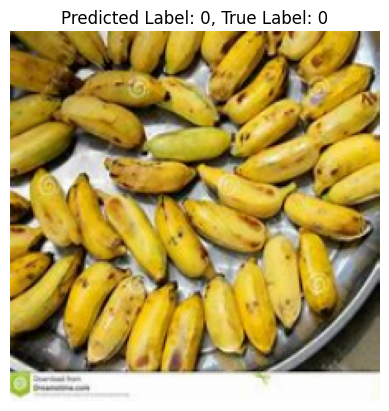

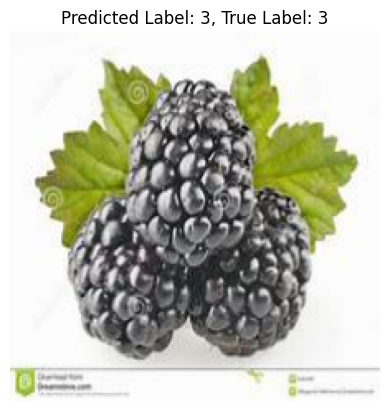

1/1 [==============================] - 0s 56ms/step


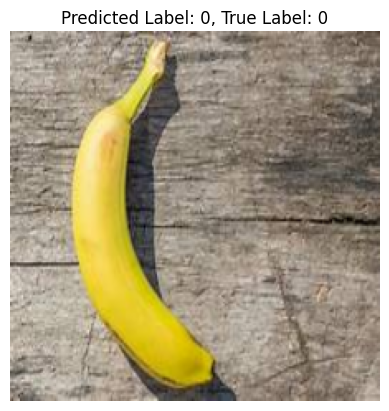

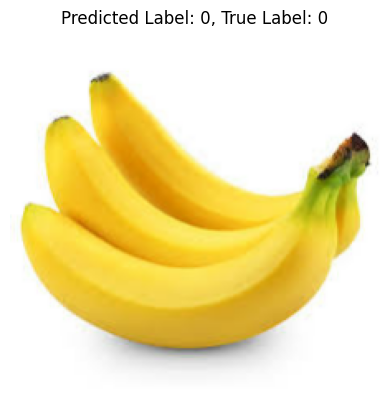

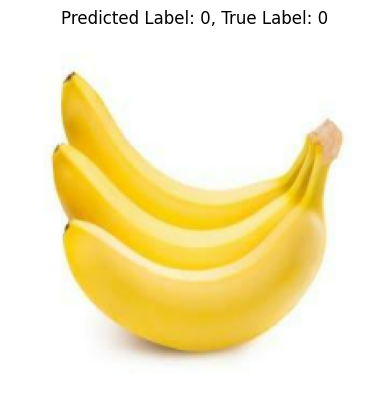

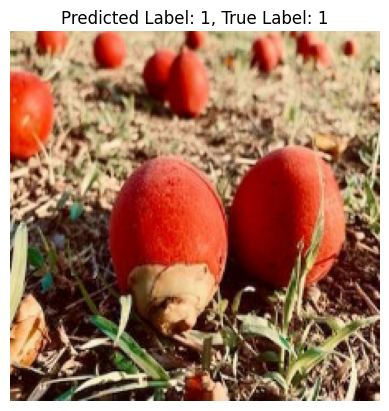

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

num_samples = 10

test_ds_shuffled = test_ds.shuffle(buffer_size=len(test_ds), seed=SEED_VALUE)

test_samples = test_ds_shuffled.take(num_samples)

for image_batch, label_batch in test_samples:
    predicted_labels = np.argmax(model_modif_2.predict(image_batch), axis=-1)
    true_labels = np.argmax(label_batch, axis=-1)

    for i in range(len(predicted_labels)):
        image = image_batch[i].numpy()
        plt.imshow(image.astype("uint8"))
        plt.title(f"Predicted Label: {predicted_labels[i]}, True Label: {true_labels[i]}")
        plt.axis('off')
        plt.show()


From the tests conducted with 40 images, the model successfully predicted all images correctly according to their classes. It can be concluded that this model is well-performing and suitable for predicting images of banana, betel nut, bitter gourd, and black berry. Additionally, it can be inferred that the choice of the EfficientNet backbone and the selected parameters were very appropriate and effectively addressed the challenges present in the given image data.